# Exercise 1
Modify your code from exercise 5 of the first homework to use the boundary conditions given in the text, equations (2.110) and (2.111).  Test the accuracy and convergence rate of the computed solution and compare with your results from homework 1, exercise 5.

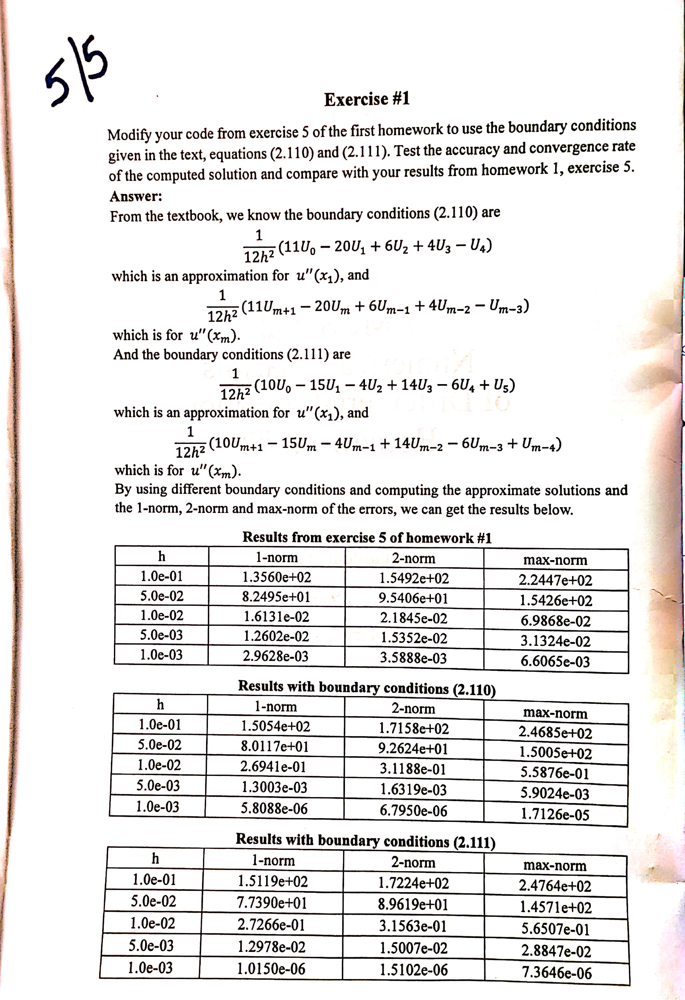

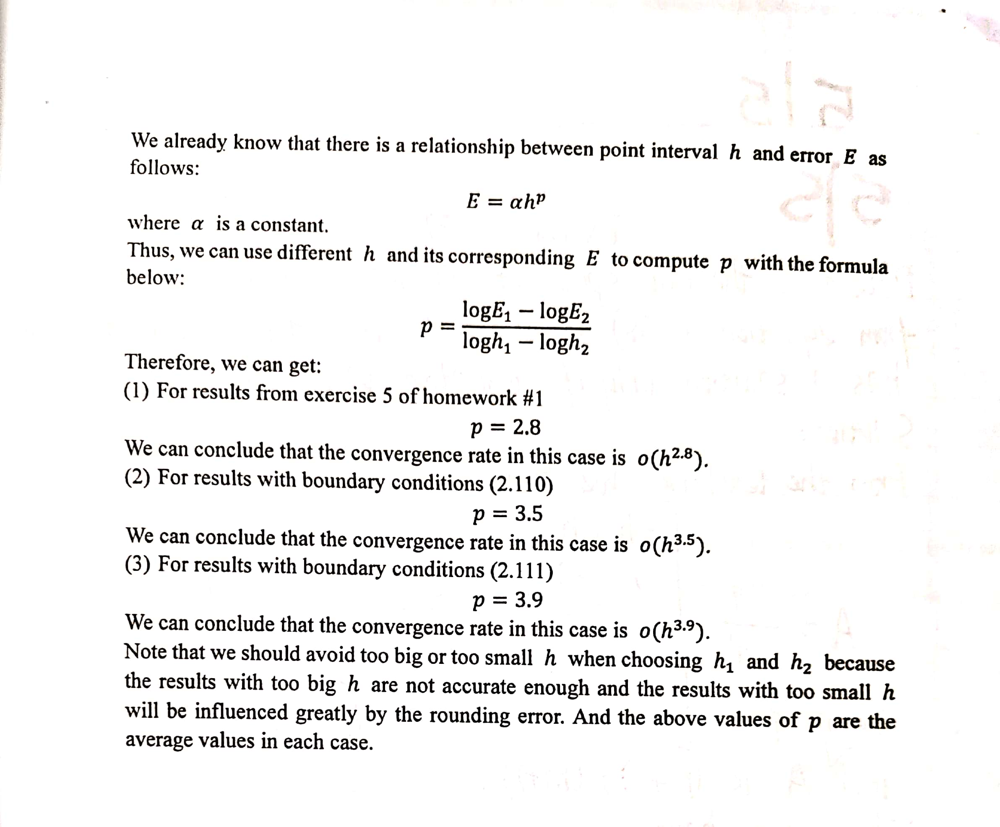

# Exercise 2

*(pencil and paper)*

Determine the null space of the matrix $A^T$, where $A$ is the matrix from equation (2.58) in the text. Use this to show that this equation has a solution only if equation (2.62) is satisfied.  

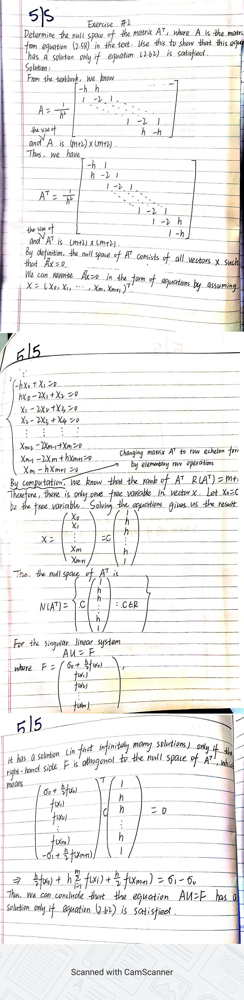

# Exercise 3
In this exercise, you will solve the nonlinear boundary value problem:

$$\begin{align*}\theta''(t) = -\sin(\theta(t)) \\ \theta(0)=\alpha, \quad \quad \theta(T)=\beta\end{align*}$$  

corresponding to the motion a rigid pendulum, where $\phi$ is the angle between the pendulum and the vertical axis (with $\phi=0$ corresponding to the pendulum hanging directly downward).  
  
You should use Newton's method, which amounts to solving the system  
$$J(\theta^{[k]}) \delta^{[k]} = - G(\theta^{[k]})$$  
where the superscript $[k]$ denotes the iteration number. The next iterative solution is then  
$$\theta^{[k]+1} = \theta^{[k]} + \delta^{[k]}.$$  
The code below constructs $G$ and $J$.

In [1]:
def G(theta,alpha,beta,h):
    Gval = np.zeros(len(theta))
    Gval[0] = theta[1]-2*theta[0]+alpha
    Gval[1:-1] = theta[:-2]-2*theta[1:-1]+theta[2:]
    Gval[-1] = theta[-2]-2*theta[-1]+beta
    Gval /= h**2
    Gval += np.sin(theta)
    return Gval

def J(theta,h,T):
    m = T/h-1.
    e = np.ones(m)
    return 1./h**2*(np.diag(-2*e,0)+np.diag(e[:-1],-1)+np.diag(e[:-1],1))+np.diag(np.cos(theta))

Now for your part:

(a) Write a program that solves the problem above (for given values of $T,\alpha,\beta$) by using Newton's method. Test your code with the boundary conditions and initial guesses given in the textbook. 

(b) Try taking $T$ larger (perhaps $6\pi, 8\pi$, or larger) and see what kinds of solutions you can find. You will probably observe that Newton's method is very sensitive to the initial guess and often diverges (note that if it's going to converge, it usually won't take more than 10 iterations to do so). Make sure your initial guess satisfies the boundary conditions, and try adjusting it until you find some solutions. Can you find two initial guesses that are very close but converge to very different final solutions? You may also find solutions that have "boundary layers" (see section 2.17 of the text, if you're interested). Try to explain what physical behavior each solution corresponds to. 